In [1]:
!pip install -q ultralytics
import ultralytics
from ultralytics import YOLO
import torch
print('Ultralytics', ultralytics.__version__, '| GPU:', torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'NO GPU, fix accelerator')

# ---------------- CONFIG ----------------
OUT_DIR = '/kaggle/working/dataset'
MODEL_NAME = 'yolov8s.pt'
EPOCHS = 100
IMGSZ = 640
BATCH = 16
SEED = 42
SPLIT_RATIO = (0.75, 0.15, 0.10)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 4.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.123 | GPU: True
Tesla T4


In [5]:
from pathlib import Path
from collections import Counter

IMG_EXT = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}
INPUT = Path('/kaggle/input')

def scan(root):
    files = [p for p in root.rglob('*') if p.is_file() and '__MACOSX' not in str(p)
             and not p.name.startswith('._')]
    return (sum(1 for p in files if p.suffix.lower() in IMG_EXT),
            sum(1 for p in files if p.suffix.lower() == '.xml'),
            sum(1 for p in files if p.suffix.lower() == '.txt'))

annotated_root, unlabelled_root = None, None

print('=' * 78)
print('ATTACHED INPUTS')
print('=' * 78)
for d in sorted(INPUT.iterdir()):
    if not d.is_dir():
        continue
    ni, nx, nt = scan(d)
    print(f'{d.name:<40} images:{ni:<6} xml:{nx:<6} txt:{nt}')
    # show one level down so nested annotation folders are visible
    for sub in sorted(x for x in d.iterdir() if x.is_dir()):
        si, sx, st = scan(sub)
        print(f'    -> {sub.name:<34} images:{si:<6} xml:{sx:<6} txt:{st}')
    if (nx or nt) and ni:
        annotated_root = d
    elif ni:
        unlabelled_root = d

# ---- fallback: pull the annotated dataset directly, no token, no UI ----
if annotated_root is None:
    print('\nNo annotated input attached. Downloading via kagglehub...')
    import kagglehub
    p = Path(kagglehub.dataset_download('chitholian/annotated-potholes-dataset'))
    print('Downloaded to:', p)

    # unpack any nested zip the download may contain
    import zipfile, shutil
    work = Path('/kaggle/working/annotated')
    shutil.rmtree(work, ignore_errors=True)
    shutil.copytree(p, work)
    for z in [q for q in work.rglob('*.zip')]:
        print('Extracting nested zip:', z.name)
        zipfile.ZipFile(z).extractall(z.parent)

    ni, nx, nt = scan(work)
    print(f'Annotated source -> images:{ni}  xml:{nx}  txt:{nt}')
    annotated_root = work

print('\n' + '=' * 78)
print('ANNOTATED (training)  :', annotated_root)
print('UNLABELLED (test set) :', unlabelled_root)
print('=' * 78)

assert annotated_root is not None, 'Still no annotations. Turn Settings > Internet ON and re-run.'

sample = next((q for q in annotated_root.rglob('*.xml')), None) or \
         next((q for q in annotated_root.rglob('*.txt')), None)
print('\nSample annotation:', sample.name)
print(sample.read_text(errors='ignore')[:600])

ATTACHED INPUTS
datasets                                 images:1236   xml:0      txt:0
    -> sachinpatel21                      images:1236   xml:0      txt:0

No annotated input attached. Downloading via kagglehub...
Downloaded to: /kaggle/input/datasets/chitholian/annotated-potholes-dataset
Annotated source -> images:665  xml:665  txt:0

ANNOTATED (training)  : /kaggle/working/annotated
UNLABELLED (test set) : /kaggle/input/datasets

Sample annotation: img-50.xml
<annotation>
	<folder>dataset</folder>
	<filename>img-50.jpg</filename>
	<path>/CSE-800/Thesis/2020-01-23/dataset/img-50.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>720</width>
		<height>720</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>pothole</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>276</xmin>
			<ymin>272</ymin>
			<xmax>394</xmax>
			<ymax>344</ymax>
		</bndbox>
	</object>
</annotati

In [6]:
import os, random, shutil
import xml.etree.ElementTree as ET
from PIL import Image

RAW, OUT = annotated_root, Path(OUT_DIR)

images = [p for p in RAW.rglob('*') if p.suffix.lower() in IMG_EXT and '__MACOSX' not in str(p)]
xmls   = [p for p in RAW.rglob('*.xml') if '__MACOSX' not in str(p)]
txts   = [p for p in RAW.rglob('*.txt')
          if p.stem.lower() not in {'readme', 'classes', 'requirements', 'license'}]

by_stem = {}
for p in images:
    by_stem.setdefault(p.stem, p)

def read_voc():
    out = []
    for x in xmls:
        try:
            root = ET.parse(x).getroot()
        except Exception:
            continue
        fn = (root.findtext('filename') or '').strip()
        img = by_stem.get(Path(fn).stem) or by_stem.get(x.stem)
        if img is None:
            continue
        with Image.open(img) as im:
            W, H = im.size
        boxes = []
        for obj in root.iter('object'):
            name = (obj.findtext('name') or 'pothole').strip().lower()
            bb = obj.find('bndbox')
            if bb is None:
                continue
            try:
                x1, y1 = float(bb.findtext('xmin')), float(bb.findtext('ymin'))
                x2, y2 = float(bb.findtext('xmax')), float(bb.findtext('ymax'))
            except (TypeError, ValueError):
                continue
            if x2 < x1: x1, x2 = x2, x1
            if y2 < y1: y1, y2 = y2, y1
            x1, x2 = max(0, min(x1, W)), max(0, min(x2, W))
            y1, y2 = max(0, min(y1, H)), max(0, min(y2, H))
            bw, bh = x2 - x1, y2 - y1
            if bw < 2 or bh < 2:
                continue
            boxes.append((name, (x1+x2)/2/W, (y1+y2)/2/H, bw/W, bh/H))
        out.append((img, boxes))
    return out

def read_yolo():
    names = None
    for c in list(RAW.rglob('classes.txt')) + list(RAW.rglob('*.names')):
        names = [l.strip() for l in c.read_text().splitlines() if l.strip()]
        break
    out = []
    for t in txts:
        img = by_stem.get(t.stem)
        if img is None:
            continue
        boxes = []
        for line in t.read_text(errors='ignore').splitlines():
            parts = line.split()
            if len(parts) < 5:
                continue
            try:
                ci = int(float(parts[0])); xc, yc, w, h = (float(v) for v in parts[1:5])
            except ValueError:
                continue
            nm = names[ci] if names and ci < len(names) else 'pothole'
            boxes.append((nm.lower(), xc, yc, w, h))
        out.append((img, boxes))
    return out

records = read_voc() if xmls else read_yolo()

merged = {}
for img, bs in records:
    if img not in merged or len(bs) > len(merged[img]):
        merged[img] = bs
records = [(i, b) for i, b in merged.items() if b]
assert records, 'Parsing produced 0 records'

counts = Counter(b[0] for _, bs in records for b in bs)
class_names = sorted(counts)
name2id = {n: i for i, n in enumerate(class_names)}
total = sum(counts.values())
areas = [b[3]*b[4] for _, bs in records for b in bs]

print(f'Images with boxes : {len(records)}')
print(f'Total boxes       : {total}  (avg {total/len(records):.2f} per image)')
print(f'Classes           : {class_names}')
print(f'Small objects (<1% area): {sum(1 for a in areas if a < 0.01)}/{total}')

random.seed(SEED); random.shuffle(records)
n = len(records)
n_tr, n_va = int(SPLIT_RATIO[0]*n), int(SPLIT_RATIO[1]*n)
splits = {'train': records[:n_tr], 'val': records[n_tr:n_tr+n_va], 'test': records[n_tr+n_va:]}

shutil.rmtree(OUT, ignore_errors=True)
for s, recs in splits.items():
    (OUT/'images'/s).mkdir(parents=True, exist_ok=True)
    (OUT/'labels'/s).mkdir(parents=True, exist_ok=True)
    for img, boxes in recs:
        dst = OUT/'images'/s/(img.stem + img.suffix.lower())
        k = 1
        while dst.exists():
            dst = OUT/'images'/s/f'{img.stem}_{k}{img.suffix.lower()}'; k += 1
        shutil.copy2(img, dst)
        lines = [f'{name2id[nm]} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}' for nm, xc, yc, w, h in boxes]
        (OUT/'labels'/s/(dst.stem + '.txt')).write_text('\n'.join(lines) + '\n')

print('Split sizes ->', {s: len(v) for s, v in splits.items()})

DATA_YAML = OUT/'data.yaml'
DATA_YAML.write_text(
    f'path: {OUT}\ntrain: images/train\nval: images/val\ntest: images/test\n\n'
    f'nc: {len(class_names)}\nnames:\n' + ''.join(f'  {i}: {n}\n' for i, n in enumerate(class_names))
)
print(DATA_YAML.read_text())

Images with boxes : 665
Total boxes       : 1739  (avg 2.62 per image)
Classes           : ['pothole']
Small objects (<1% area): 577/1739
Split sizes -> {'train': 498, 'val': 99, 'test': 68}
path: /kaggle/working/dataset
train: images/train
val: images/val
test: images/test

nc: 1
names:
  0: pothole



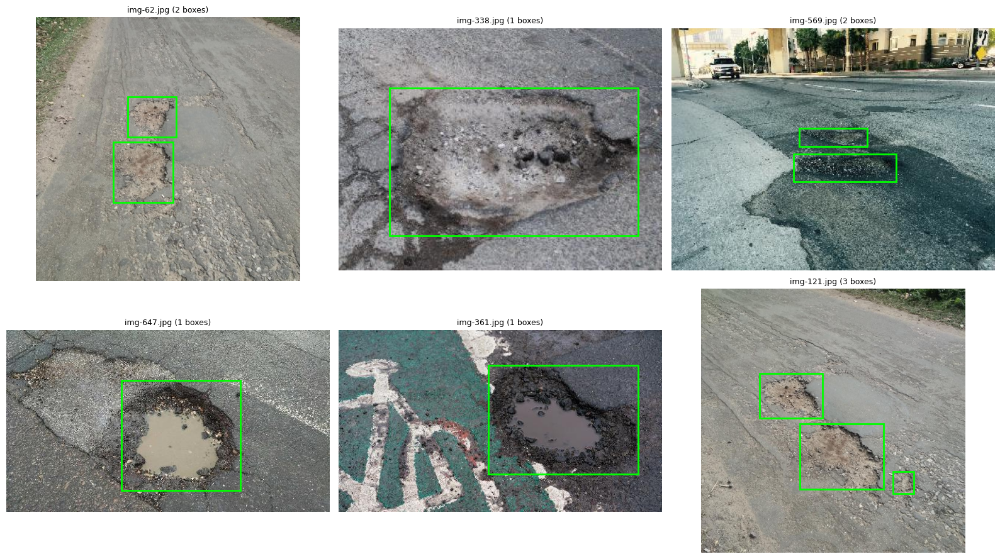

In [7]:
import matplotlib.pyplot as plt, matplotlib.patches as patches, random

files = sorted((OUT/'images'/'train').glob('*'))
random.seed(0); sel = random.sample(files, min(6, len(files)))
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
for ax in axes.ravel(): ax.axis('off')
for ax, f in zip(axes.ravel(), sel):
    im = Image.open(f).convert('RGB'); W, H = im.size
    ax.imshow(im)
    nb = 0
    for line in (OUT/'labels'/'train'/(f.stem+'.txt')).read_text().splitlines():
        if not line.strip(): continue
        c, xc, yc, w, h = line.split()
        xc, yc, w, h = float(xc)*W, float(yc)*H, float(w)*W, float(h)*H
        ax.add_patch(patches.Rectangle((xc-w/2, yc-h/2), w, h, lw=2, edgecolor='lime', facecolor='none'))
        nb += 1
    ax.set_title(f'{f.name} ({nb} boxes)', fontsize=9)
plt.tight_layout(); plt.show()

In [8]:
from ultralytics import YOLO
from pathlib import Path

model = YOLO(MODEL_NAME)
results = model.train(
    data=str(DATA_YAML), epochs=EPOCHS, imgsz=IMGSZ, batch=BATCH,
    patience=25, seed=SEED, workers=2, cache=True, close_mosaic=10,
    device=0, project='/kaggle/working/runs', name='pothole', exist_ok=True, plots=True,
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, translate=0.1, scale=0.5, fliplr=0.5, mosaic=1.0,
)
RUN = Path(results.save_dir)
BEST = RUN/'weights'/'best.pt'
print('Best weights:', BEST)

Ultralytics 8.4.123 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pothole, nbs=64, nms=False, 


>>> results.png


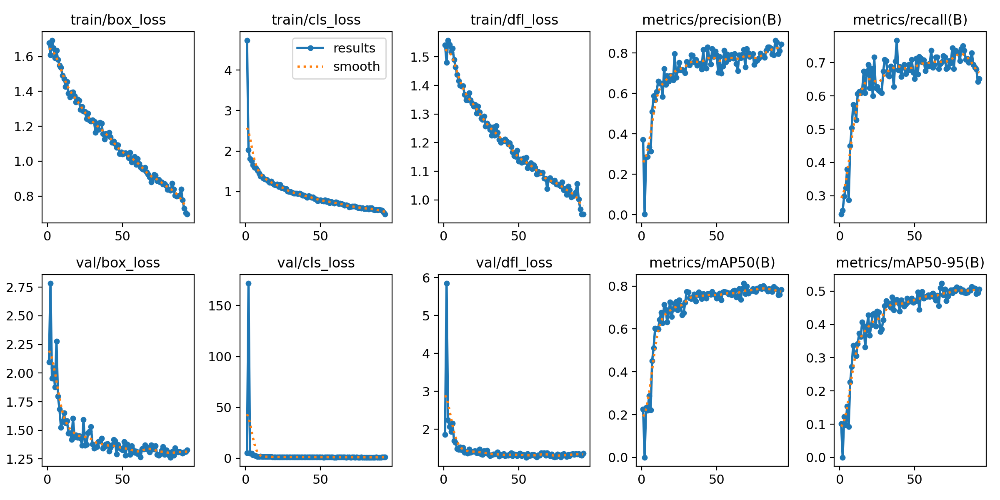


>>> confusion_matrix_normalized.png


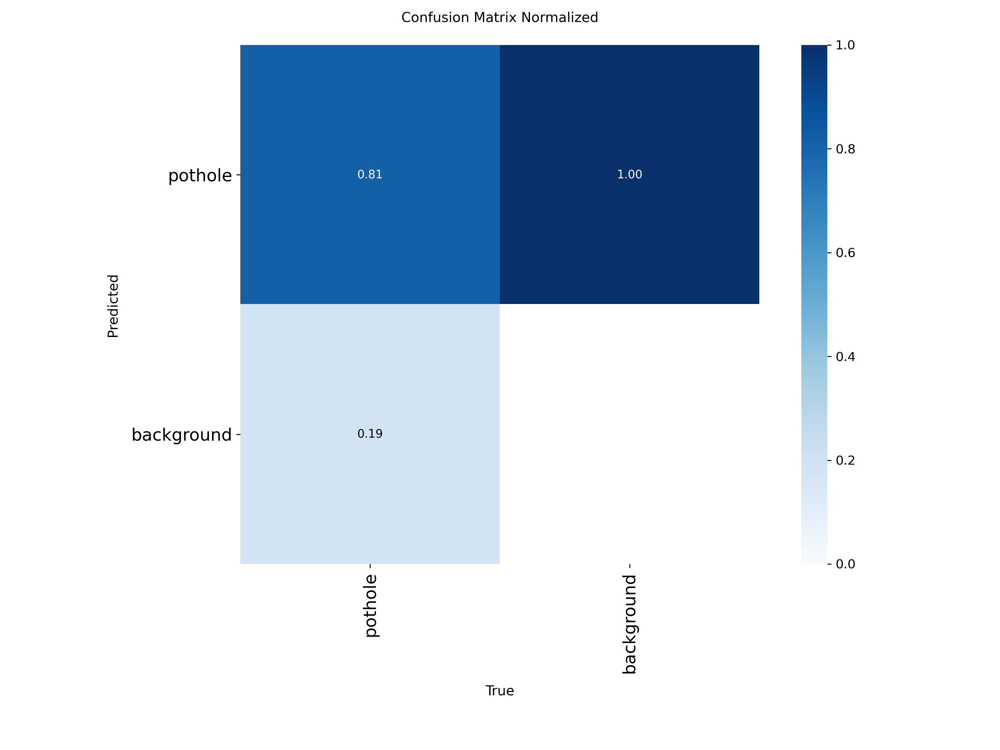


>>> BoxPR_curve.png


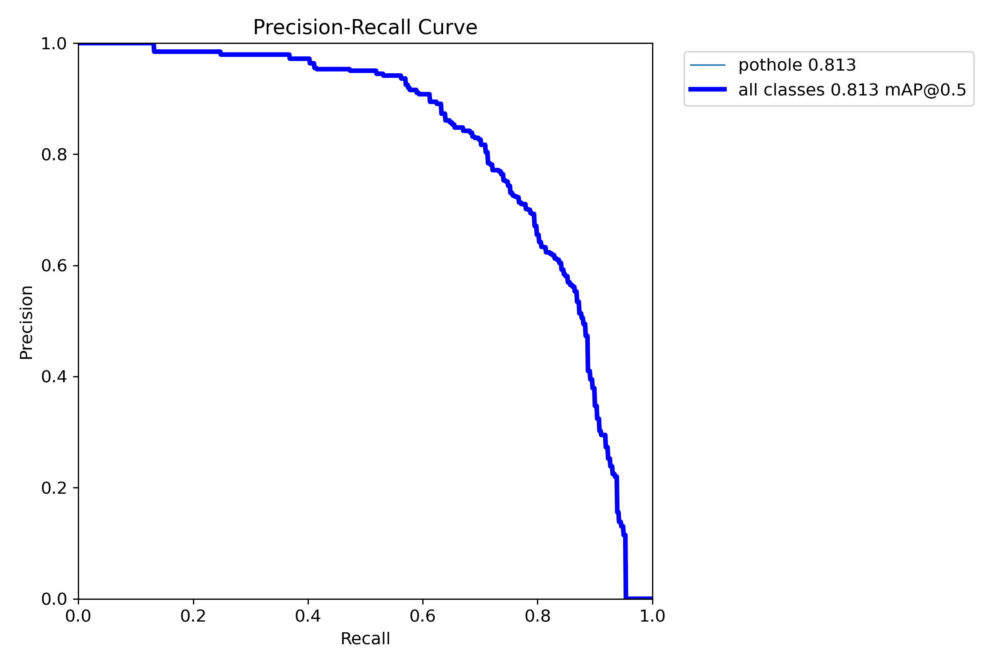

Ultralytics 8.4.123 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1531.8±581.8 MB/s, size: 90.2 KB)
val: Scanning /kaggle/working/dataset/labels/test... 68 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 68/68 1.2Kit/s 0.1s
val: New cache created: /kaggle/working/dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 3.0it/s 1.7s0.5s
                   all         68        193      0.751      0.725      0.763      0.466
Speed: 4.3ms preprocess, 12.1ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /kaggle/working/runs/pothole_test

TEST SET PERFORMANCE
  Precision : 0.7511
  Recall    : 0.7254
  F1        : 0.7380
  mAP@50    : 0.7633
  mAP@50-95 : 0.4660


In [9]:
from IPython.display import Image as IPImage, display
import pandas as pd

for fn in ['results.png', 'confusion_matrix_normalized.png', 'BoxPR_curve.png', 'PR_curve.png']:
    p = RUN/fn
    if p.exists():
        print('\n>>>', fn); display(IPImage(filename=str(p), width=900))

best_model = YOLO(str(BEST))
m = best_model.val(data=str(DATA_YAML), split='test', imgsz=IMGSZ, conf=0.001, iou=0.6,
                   project='/kaggle/working/runs', name='pothole_test', exist_ok=True)
b = m.box
print('\n' + '='*55)
print('TEST SET PERFORMANCE')
print('='*55)
print(f'  Precision : {b.mp:.4f}')
print(f'  Recall    : {b.mr:.4f}')
print(f'  F1        : {2*b.mp*b.mr/(b.mp+b.mr+1e-9):.4f}')
print(f'  mAP@50    : {b.map50:.4f}')
print(f'  mAP@50-95 : {b.map:.4f}')

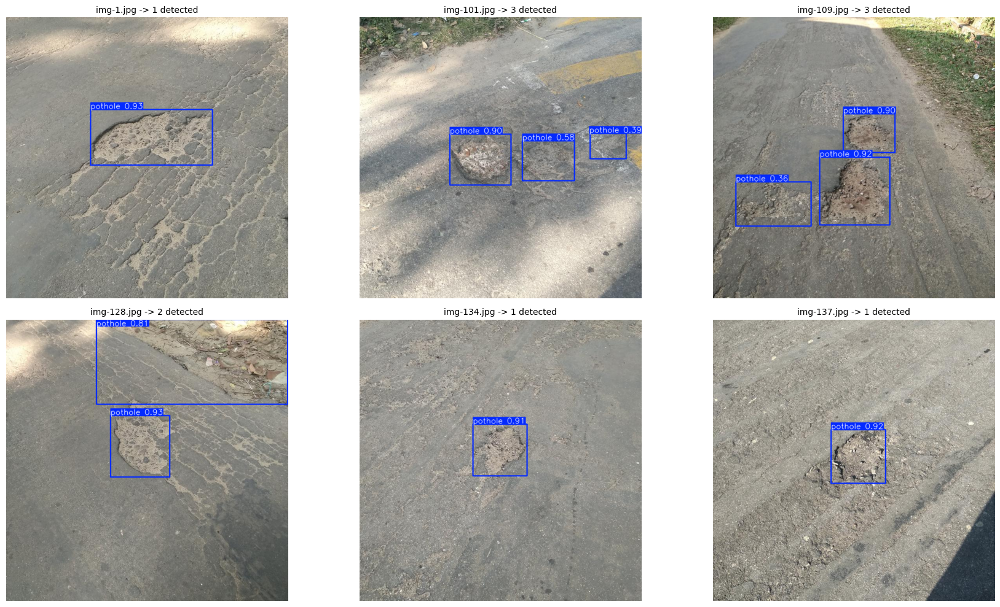

In [10]:
test_imgs = sorted((OUT/'images'/'test').glob('*'))[:6]
preds = best_model.predict(source=[str(p) for p in test_imgs], conf=0.35, imgsz=IMGSZ, verbose=False)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax in axes.ravel(): ax.axis('off')
for ax, r in zip(axes.ravel(), preds):
    ax.imshow(r.plot()[:, :, ::-1])
    ax.set_title(f'{Path(r.path).name} -> {len(r.boxes)} detected', fontsize=10)
plt.tight_layout(); plt.show()

1901 unlabelled images
GENERALIZATION ON YOUR 618 SCRAPED IMAGES
  Images with a detection : 1883/1901 (99.1%)
  Total detections        : 8156
  Mean confidence         : 0.710


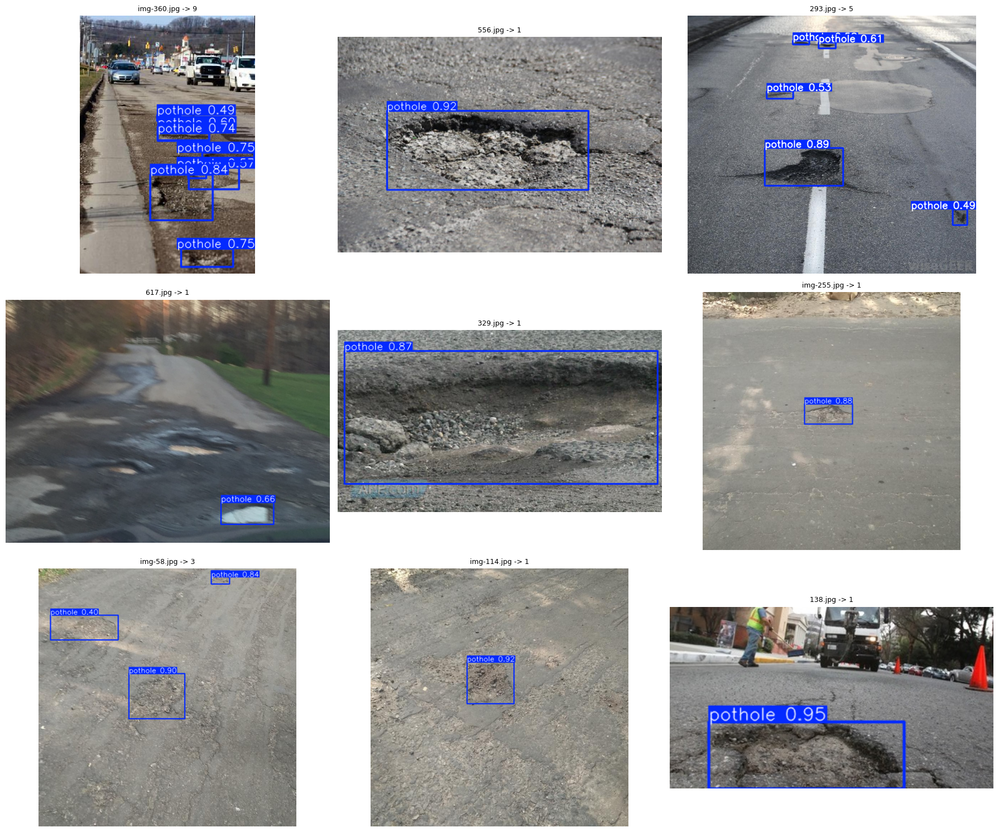

In [11]:
unlab = [p for p in unlabelled_root.rglob('*')
         if p.suffix.lower() in IMG_EXT and '__MACOSX' not in str(p)] if unlabelled_root else []
print(f'{len(unlab)} unlabelled images')

CONF = 0.35
hits = total_boxes = 0; confs = []
for i in range(0, len(unlab), 32):
    for r in best_model.predict(source=[str(p) for p in unlab[i:i+32]],
                                conf=CONF, imgsz=IMGSZ, verbose=False):
        total_boxes += len(r.boxes); hits += len(r.boxes) > 0
        confs += [float(x.conf) for x in r.boxes]

print('='*55)
print('GENERALIZATION ON YOUR 618 SCRAPED IMAGES')
print('='*55)
print(f'  Images with a detection : {hits}/{len(unlab)} ({100*hits/max(len(unlab),1):.1f}%)')
print(f'  Total detections        : {total_boxes}')
if confs: print(f'  Mean confidence         : {sum(confs)/len(confs):.3f}')

random.seed(1); sel = random.sample(unlab, min(9, len(unlab)))
preds = best_model.predict(source=[str(p) for p in sel], conf=CONF, imgsz=IMGSZ, verbose=False)
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
for ax in axes.ravel(): ax.axis('off')
for ax, r in zip(axes.ravel(), preds):
    ax.imshow(r.plot()[:, :, ::-1])
    ax.set_title(f'{Path(r.path).name} -> {len(r.boxes)}', fontsize=9)
plt.tight_layout(); plt.show()

In [12]:
import json, shutil
SAVE = Path('/kaggle/working/pothole_model'); SAVE.mkdir(exist_ok=True)
shutil.copy(BEST, SAVE/'best.pt')
shutil.copy(DATA_YAML, SAVE/'data.yaml')
(SAVE/'classes.json').write_text(json.dumps(class_names, indent=2))
for fn in ['results.csv', 'results.png', 'confusion_matrix_normalized.png']:
    if (RUN/fn).exists(): shutil.copy(RUN/fn, SAVE/fn)
for f in sorted(SAVE.iterdir()):
    print(f.name, '%.1f MB' % (f.stat().st_size/1e6))

def detect_potholes(image_path, conf=0.35):
    r = best_model.predict(source=image_path, conf=conf, imgsz=IMGSZ, verbose=False)[0]
    return [{'class': class_names[int(x.cls)], 'confidence': round(float(x.conf), 3),
             'bbox': [round(v, 1) for v in x.xyxy[0].tolist()]} for x in r.boxes]

best.pt 22.5 MB
classes.json 0.0 MB
confusion_matrix_normalized.png 0.1 MB
data.yaml 0.0 MB
results.csv 0.0 MB
results.png 0.3 MB
